## Imports and Constants

In [1]:
import os
import random
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchaudio
import soundfile as sf
from IPython.display import Audio

def dummy_npwarn_decorator_factory():
  def npwarn_decorator(x):
    return x
  return npwarn_decorator
np._no_nep50_warning = getattr(np, '_no_nep50_warning', dummy_npwarn_decorator_factory)

In [2]:
SAMPLE_RATE = 44100
EXPORT = './export'
random.seed(24)

In [3]:
torch.cuda.empty_cache()

## Exploratory Data Analysis and Preprocessing
Our data comes from various sources:
- [www.youtube.com/watch?v=lTRiuFIWV54](https://www.youtube.com/watch?v=lTRiuFIWV54)
- [archive.org/details/deep-spot-city-of-gamers-chill-gaming-studying-lofi-hip-hop-mix-1-hour](archive.org/details/deep-spot-city-of-gamers-chill-gaming-studying-lofi-hip-hop-mix-1-hour)
- [https://archive.org/details/lo-fi-for-reading-manga-pb8ljm/Mabisyo+-+Lo%E2%80%8B-%E2%80%8BFi+For+Reading+Manga+-+04+Monkey+D.+Luffy.flac](https://archive.org/details/lo-fi-for-reading-manga-pb8ljm/Mabisyo+-+Lo%E2%80%8B-%E2%80%8BFi+For+Reading+Manga+-+04+Monkey+D.+Luffy.flac)
- [https://archive.org/details/motel-smoke-at-2-am](https://archive.org/details/motel-smoke-at-2-am)
- [https://archive.org/details/kalaido-hanging-lanterns_202101/flovry+-+car+radio.wav](https://archive.org/details/kalaido-hanging-lanterns_202101/flovry+-+car+radio.wav)

With the help of some chatGPT code I converted all of the clips to .wav and split them into 11 second chunks. Uncomment and run todo preprocessing on new clips

In [4]:
# # code adjusted from chatGPT with prompts "write me a snippet of code to convert flac, wav, mp3, and m4a into 11 second long wav files with a sample rate of 44100 Hz", "write me a snippet of code to convert flac, wav, mp3, and m4a into 11 second long wav files with a sample rate of 44100 Hz", "discard the final chunk instead of padding=", "can you use torchaudio instead of pydub"

# # Settings
# input_dir = "./raw_audio/unfinished" 
# output_dir = "./train_data"
# target_sr = 44100
# chunk_duration_s = 11  # 11 seconds
# chunk_duration_samples = target_sr * chunk_duration_s  # 11 seconds in samples

# os.makedirs(output_dir, exist_ok=True)
# valid_exts = (".flac", ".wav", ".mp3", ".m4a")

# def load_audio(file_path, sr):
#     """
#     Load audio using torchaudio for supported formats or librosa for others.
#     """
#     ext = file_path.lower().split('.')[-1]
    
#     if ext in ['flac', 'wav']:
#         waveform, original_sr = torchaudio.load(file_path)
#     else:
#         waveform, original_sr = librosa.load(file_path, sr=None)  # Load with original sampling rate
#         waveform = torch.tensor(waveform)  # Convert to torch tensor
    
#     if original_sr != sr:
#         # Resample if needed
#         resampler = torchaudio.transforms.Resample(orig_freq=original_sr, new_freq=sr)
#         waveform = resampler(waveform)
    
#     return waveform

# def split_audio(waveform, chunk_length_samples):
#     """
#     Split the waveform into 11-second chunks.
#     """
#     num_chunks = waveform.size(1) // chunk_length_samples
#     return [waveform[:, i * chunk_length_samples:(i + 1) * chunk_length_samples] for i in range(num_chunks)]

# for filename in os.listdir(input_dir):
#     if filename.lower().endswith(valid_exts):
#         input_path = os.path.join(input_dir, filename)
#         base_name = os.path.splitext(filename)[0]

#         try:
#             # Load audio
#             waveform = load_audio(input_path, target_sr)

#             # Split into full-length chunks
#             chunks = split_audio(waveform, chunk_duration_samples)

#             # Save each chunk as a .wav file
#             for i, chunk in enumerate(chunks):
#                 chunk_filename = f"{base_name}_chunk{i+1:03d}.wav"
#                 chunk_path = os.path.join(output_dir, chunk_filename)

#                 # Save chunk
#                 torchaudio.save(chunk_path, chunk, target_sr)
#                 print(f"✅ Saved: {chunk_filename}")

#         except Exception as e:
#             print(f"❌ Error processing {filename}: {e}")

### Spectrogram conversion

In [5]:
## Code adjusted from chatGPT prompted with "using librosa loop through a batch of wav files and give me their spectrograms"
## Directory containing WAV files
#wav_dir = "./train_data"
#out_dir = "./train_data_spectrograms"
#wav_files = [f for f in os.listdir(wav_dir) if f.endswith(".wav")]

## Number of files to process
#max_files = 1000

#for i, file in enumerate(wav_files[:max_files]):
#    file_path = os.path.join(wav_dir, file)

#    # Load stereo audio (converts to mono by default)
#    y, sr = librosa.load(file_path, sr=SAMPLE_RATE, mono=True)

#    # Compute log-mel spectrogram
#    S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
#    np.save(os.path.join(out_dir, f'{i}_mel.npy'), S)

Now let's take a look at and listen to the audio generated from these spectrograms

(128, 948)


(128, 948)


(128, 948)


(128, 948)


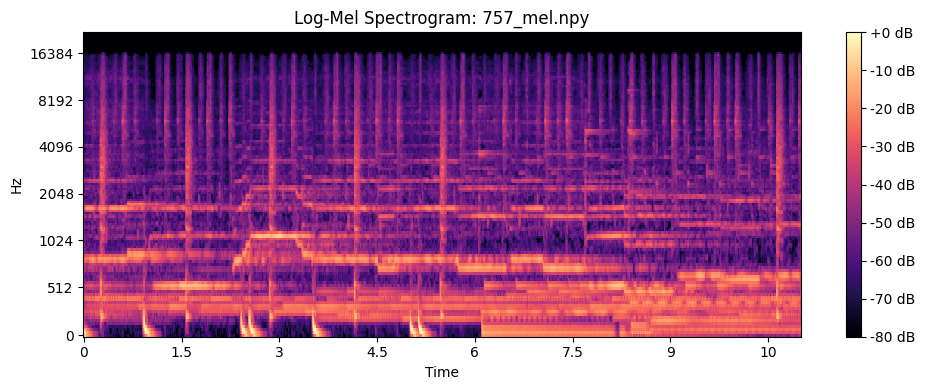

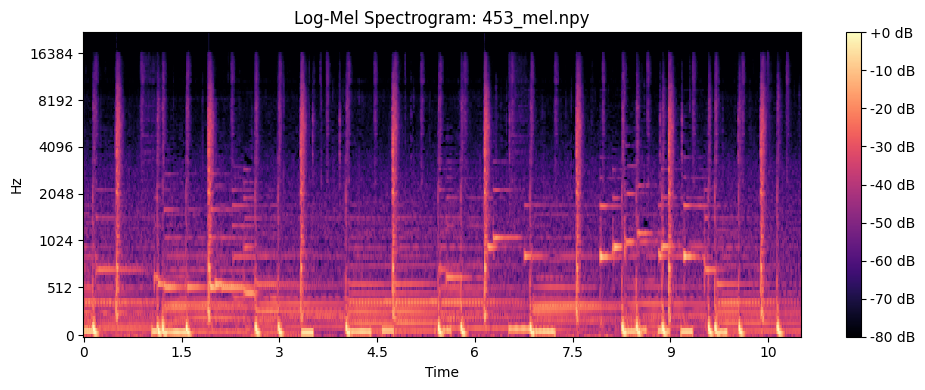

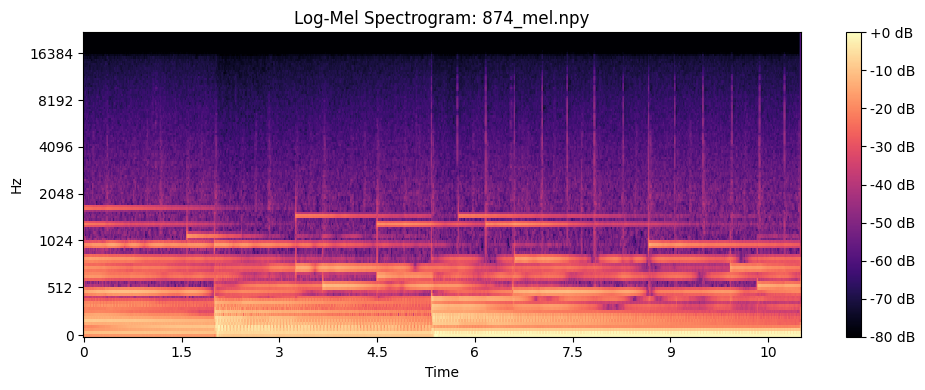

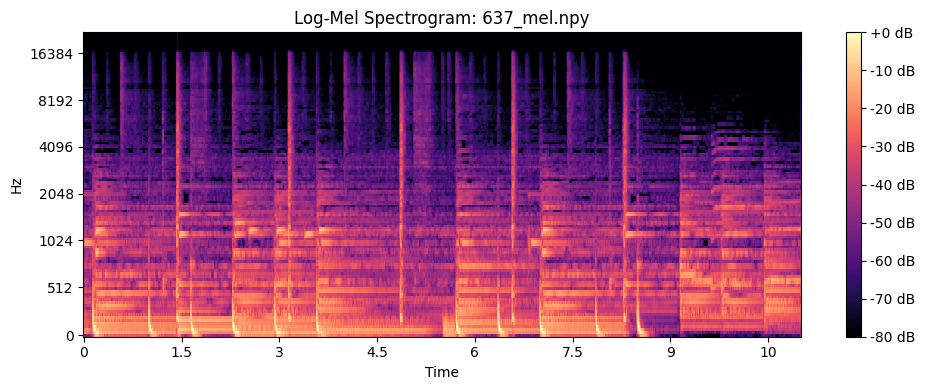

In [6]:
tensor_dir = "./train_data_spectrograms"


tensor_files = [f for f in os.listdir(tensor_dir) if f.endswith(".npy")]

max_samples = 4

for file in random.sample(tensor_files, max_samples):
    file_path = os.path.join(tensor_dir, file)

    # Load tensors
    mel = np.load(file_path)
    print(mel.shape)

    # Print spectrogram
    log_S = librosa.power_to_db(mel, ref=np.max)

    # Plot
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(log_S, sr=SAMPLE_RATE, hop_length=512, x_axis='time', y_axis='mel')
    plt.title(f"Log-Mel Spectrogram: {file}")
    plt.colorbar(format="%+2.0f dB")
    plt.tight_layout()
    plt.savefig(os.path.join(EXPORT, f"{file}_Log-Mel.png"))

    # Spectrogram to audio
    y = librosa.feature.inverse.mel_to_audio(mel, sr = SAMPLE_RATE, n_fft=2048, hop_length=512) 
    display(Audio(y, rate=SAMPLE_RATE))
    sf.write(os.path.join(EXPORT, f"{file}.wav"), y, SAMPLE_RATE)
    
    

## Model
I am following the guide on training a diffusion model from Diffusers
[https://huggingface.co/docs/diffusers/v0.33.1/en/tutorials/basic_training](https://huggingface.co/docs/diffusers/v0.33.1/en/tutorials/basic_training)

I tested various hyperparameters and found the hyperparameters below to be the best for decently fast training. 

In [7]:
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    image_size = (128, 128) #(128, 256)  # the generated image resolution
    train_batch_size = 8
    eval_batch_size = 8  # how many images to sample during evaluation
    num_epochs = 100
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 20
    save_model_epochs = 20
    mixed_precision = "fp16"  # `no` for float32, `fp16` for automatic mixed precision
    output_dir = "mel-generation"  # the model name locally and on the HF Hub
    overwrite_output_dir = True  # overwrite the old model when re-running the notebook
    seed = 0

    max_samples = -1


config = TrainingConfig()

### Dataset Loader

In [8]:
from torch.utils.data import DataLoader, Dataset

In [9]:
class SpectrogramDataset(Dataset):
    def __init__(self, spectrogram_dir, sample_size=(128, 896), max_samples = -1):
        self.sample_size = sample_size
        self.spectrogram_files = []
        for i, f in enumerate(os.listdir(spectrogram_dir)):
            if max_samples != -1 and max_samples < i :
                break
            if f.endswith(".npy"):
                self.spectrogram_files.append(os.path.join(spectrogram_dir, f))
                 
        
    
    def __len__(self):
        return len(self.spectrogram_files)

    def __getitem__(self, idx):
        # If idx is a slice, return a batch of spectrograms
        if isinstance(idx, slice):
            return [self.__getitem__(i) for i in range(*idx.indices(len(self)))]
        
        # Fetch a single spectrogram and return it with batch dimension
        spectrogram = np.load(self.spectrogram_files[idx])

        # crop to match sample_size (I'm not center cropping bc I see no benefit here)
        target_h, target_w = self.sample_size
        spectrogram = spectrogram[:target_h, :target_w]
        
        spectrogram = torch.tensor(spectrogram, dtype=torch.float32).unsqueeze(0)  # Add batch dimension
        return spectrogram
dataset = SpectrogramDataset('./train_data_spectrograms', sample_size = config.image_size, max_samples=config.max_samples)

In [10]:
train_dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.train_batch_size, shuffle=True)

In [11]:
for i, data in enumerate(dataset[:2]):

    display(data)
    

tensor([[[4.9801e+01, 9.5735e+01, 8.4604e+01,  ..., 1.9413e+00,
          1.8168e+00, 1.7897e+00],
         [9.9013e+01, 3.3336e+02, 3.9260e+02,  ..., 8.8301e+00,
          8.7300e+00, 8.7972e+00],
         [5.0395e+01, 8.8918e+01, 7.5389e+01,  ..., 2.2583e+00,
          2.5656e+00, 2.1667e+00],
         ...,
         [1.4460e-04, 3.6040e-05, 1.7846e-09,  ..., 1.0010e-09,
          1.1840e-09, 1.4590e-09],
         [1.4301e-04, 3.5646e-05, 1.0841e-09,  ..., 1.1986e-09,
          1.0729e-09, 1.0354e-09],
         [1.4195e-04, 3.5379e-05, 1.2232e-09,  ..., 1.3664e-09,
          1.3587e-09, 1.7225e-09]]])

tensor([[[5.5976e-03, 8.9468e-04, 2.3048e-05,  ..., 2.1976e-05,
          5.0490e-05, 7.8640e-05],
         [7.7224e-03, 1.4194e-03, 1.3512e-04,  ..., 4.6296e-04,
          1.8532e-04, 2.7411e-04],
         [1.2057e-02, 7.2128e-03, 1.4132e-02,  ..., 3.1841e-03,
          1.7689e-03, 8.8070e-04],
         ...,
         [3.7608e-05, 9.3756e-06, 1.4952e-09,  ..., 1.6208e-09,
          1.8723e-09, 1.3833e-09],
         [3.7141e-05, 9.2574e-06, 1.6648e-09,  ..., 1.6661e-09,
          2.0163e-09, 1.9332e-09],
         [3.6892e-05, 9.1962e-06, 1.6135e-09,  ..., 1.3921e-09,
          1.4930e-09, 1.5270e-09]]])

In [12]:
train_dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.train_batch_size, shuffle=True)

### Diffusion Model

In [13]:
from diffusers import UNet2DModel

model = UNet2DModel(
    sample_size=config.image_size,  # the target image resolution
    in_channels=1,  # the number of input channels, 3 for RGB images
    out_channels=1,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(128, 948, 256, 256, 512, 512),  # the number of output channels for each UNet block
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",  # a regular ResNet upsampling block
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
    norm_num_groups = 2,
)

# # Load from checkpoint TODO
# from diffusers import DDPMPipeline
# if config.checkpoint:
#     checkpoint_dir = os.path.join(config.output_dir, "checkpoints", config.checkpoint)
#     loaded_pipeline = DDMPipeline.from_pretrained(checkpoint_dir)
#     model = loaded_pipeline.unet
#     noise_scheduler = loaded_pipeline.scheduler



C:\Users\arthurchan\miniconda3\envs\cse153\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [14]:
sample_image = dataset[0].unsqueeze(0)
print("Input shape:", sample_image.shape)
print("Output shape:", model(sample_image, timestep=0).sample.shape)


Input shape: torch.Size([1, 1, 128, 128])
Output shape: torch.Size([1, 1, 128, 128])


In [15]:
from PIL import Image
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
noise = torch.randn(sample_image.shape)
timesteps = torch.LongTensor([50])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)

noisy_image.shape

torch.Size([1, 1, 128, 128])

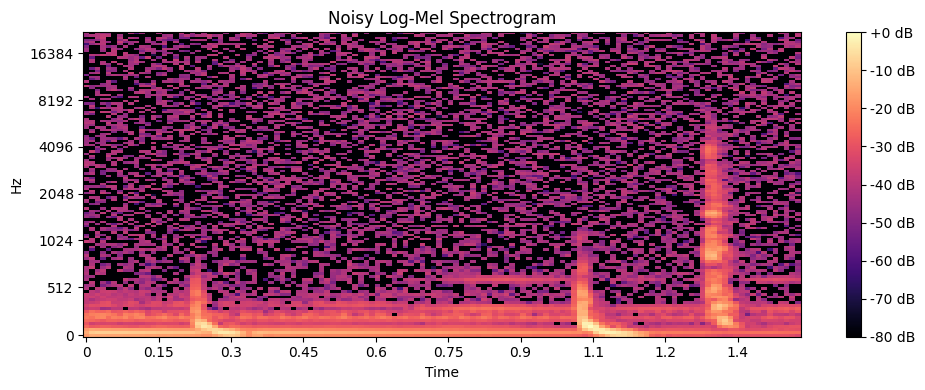

In [16]:
# visualize noisy sample
log_S = librosa.power_to_db(noisy_image[0,0,:,:], ref=np.max)

# Plot
plt.figure(figsize=(10, 4))
librosa.display.specshow(log_S, sr=SAMPLE_RATE, hop_length=512, x_axis='time', y_axis='mel')
plt.title("Noisy Log-Mel Spectrogram")
plt.colorbar(format="%+2.0f dB")
plt.tight_layout()
plt.show()

In [17]:
import torch.nn.functional as F

noise_pred = model(noisy_image, timesteps).sample

loss = F.mse_loss(noise_pred, noise)

loss

tensor(1.0781, grad_fn=<MseLossBackward0>)

## Training

In [18]:
from diffusers.optimization import get_cosine_schedule_with_warmup

optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)

lr_scheduler = get_cosine_schedule_with_warmup(

    optimizer=optimizer,

    num_warmup_steps=config.lr_warmup_steps,

    num_training_steps=(len(train_dataloader) * config.num_epochs),

)

In [19]:
from diffusers import DDPMPipeline
from diffusers.utils import make_image_grid

def evaluate(config, epoch, pipeline):

    # Sample some images from random noise (this is the backward diffusion process).

    # The default pipeline output type is `List[PIL.Image]`

    images = pipeline(

        batch_size=config.eval_batch_size,

        generator=torch.Generator(device='cpu').manual_seed(config.seed), # Use a separate torch generator to avoid rewinding the random state of the main training loop
        
        output_type = "",

        # num_inference_steps = 2 # david (undo)

    ).images

    # Save the images
    test_dir = os.path.join(config.output_dir, "samples")

    os.makedirs(test_dir, exist_ok=True)

    for i, image in enumerate(images):
        image = np.squeeze(image)
        np.save(os.path.join(test_dir, f"{epoch}_{i}.npy"), image)
    # image_grid.save(.png")

In [20]:
from accelerate import Accelerator
from tqdm.auto import tqdm
from pathlib import Path

def train_loop(config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    # Initialize accelerator and tensorboard logging
    accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps,
        log_with="tensorboard",
        project_dir=os.path.join(config.output_dir, "logs"),
    )
    if accelerator.is_main_process:
        assert config.output_dir is not None
        os.makedirs(config.output_dir, exist_ok=True)
            
        accelerator.init_trackers("train_example")

    # Prepare everything
    # There is no specific order to remember, you just need to unpack the
    # objects in the same order you gave them to the prepare method.
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )

    global_step = 0

    # Now you train the model
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader), disable=not accelerator.is_local_main_process)
        progress_bar.set_description(f"Epoch {epoch}")

        for step, batch in enumerate(train_dataloader):
            clean_images = batch
            # Sample noise to add to the images
            noise = torch.randn(clean_images.shape, device=clean_images.device)
            bs = clean_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps, (bs,), device=clean_images.device,
                dtype=torch.int64
            )

            # Add noise to the clean images according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with accelerator.accumulate(model):
                # Predict the noise residual
                noise_pred = model(noisy_images, timesteps, return_dict=False)[0]
                loss = F.mse_loss(noise_pred, noise)
                accelerator.backward(loss)

                if accelerator.sync_gradients:
                    accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            progress_bar.update(1)
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1

        # After each epoch you optionally sample some demo images with evaluate() and save the model
        if accelerator.is_main_process:
            pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)

            if (epoch + 1) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)

            if (epoch + 1) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                pipeline.save_pretrained(os.path.join(config.output_dir, "checkpoints", f"epoch_{epoch + 1}"))

### Run training
Uncomment and run to train the model

In [21]:
# from accelerate import notebook_launcher

# args = (config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler)

# notebook_launcher(train_loop, args, num_processes=1)

## Model Outputs
Below are the audio samples and the spectrograms of the diffusion model at various epochs {epoch}_{sample num}.npy

In [22]:
sample_dir = "./mel-generation/128x256"
# sample_dir = os.path.join(config.output_dir, "samples")

19_0.npy


19_1.npy


19_2.npy


19_3.npy


39_0.npy


39_1.npy


39_2.npy


39_3.npy


59_0.npy


59_1.npy


59_2.npy


59_3.npy


79_0.npy


79_1.npy


79_2.npy


79_3.npy


99_0.npy


99_1.npy


99_2.npy


99_3.npy


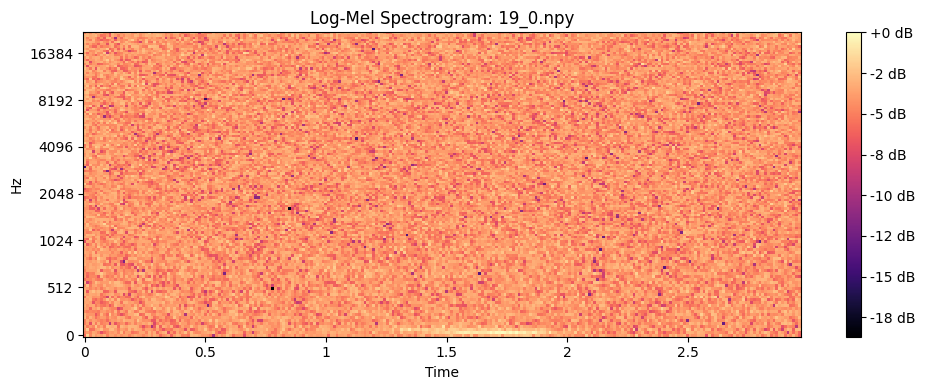

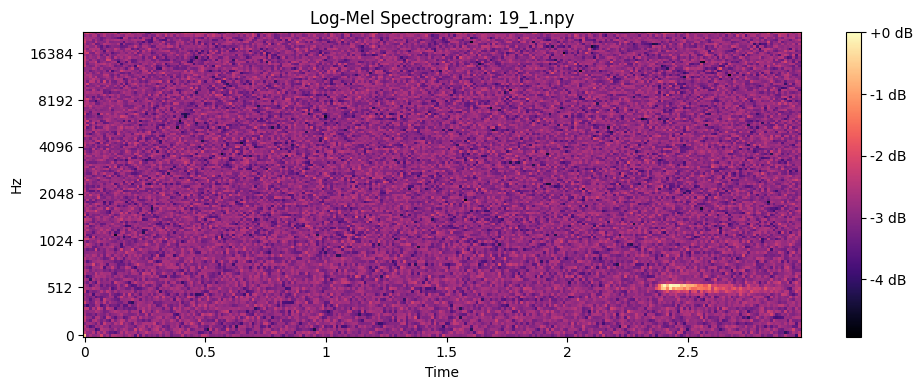

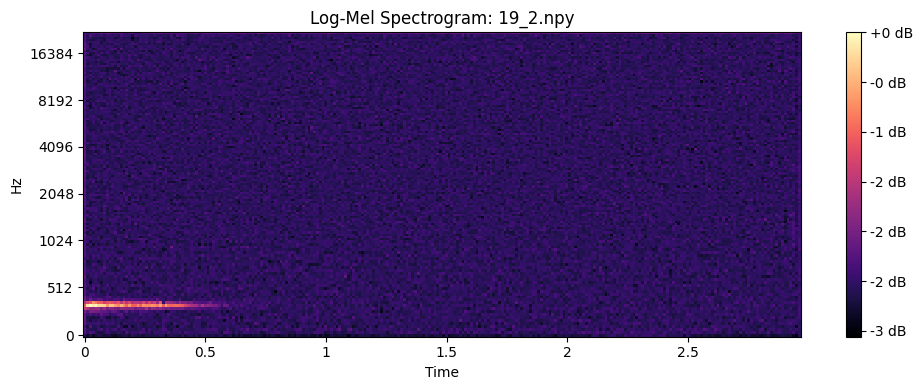

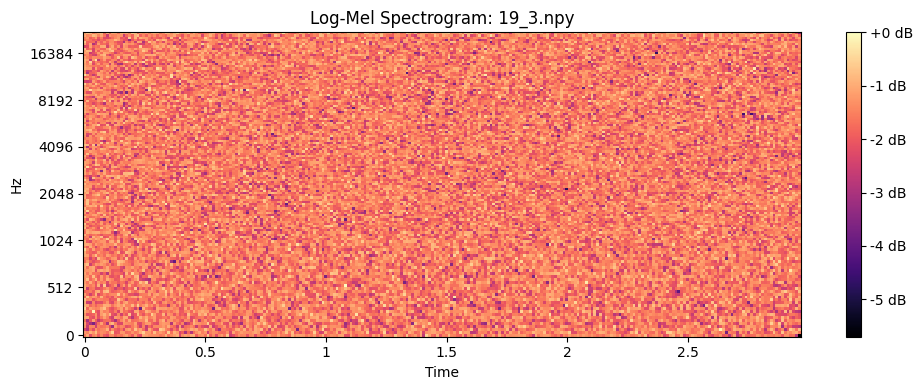

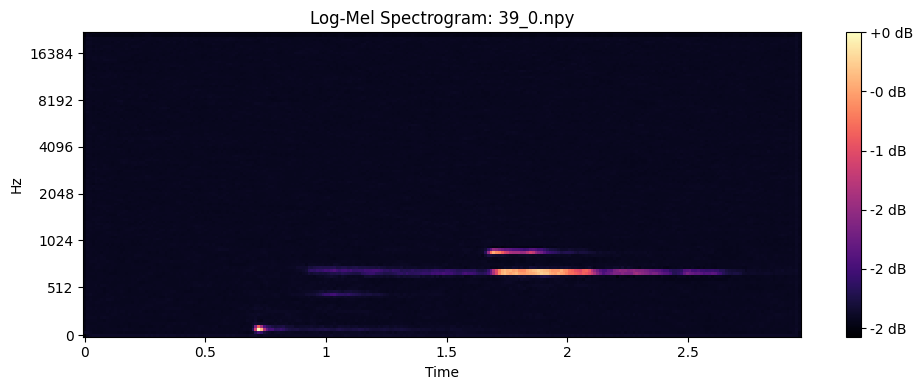

...

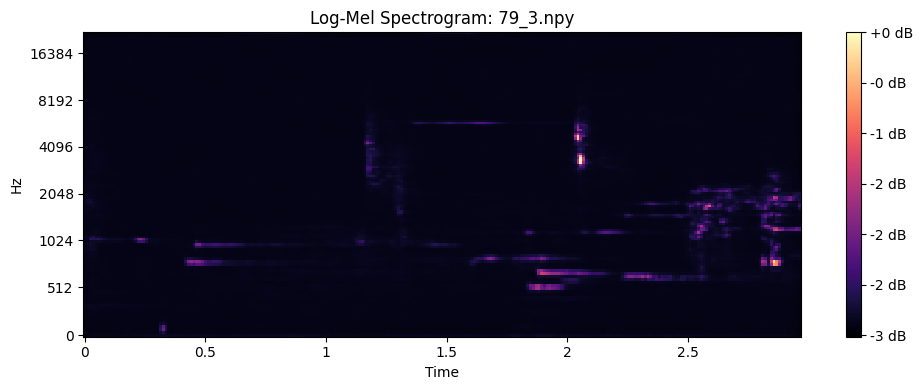

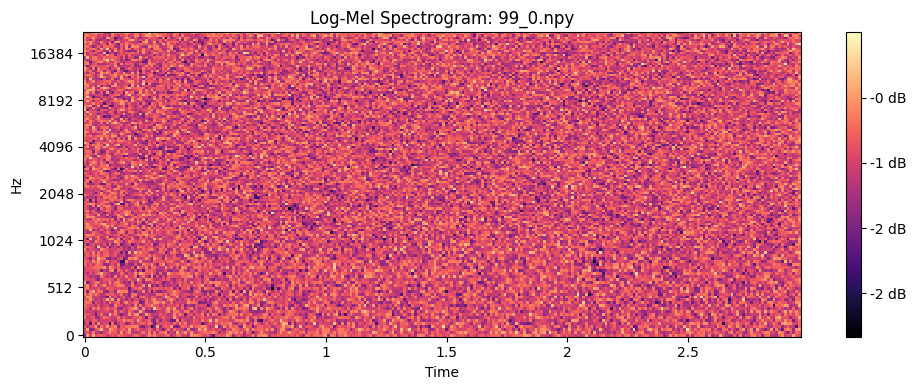

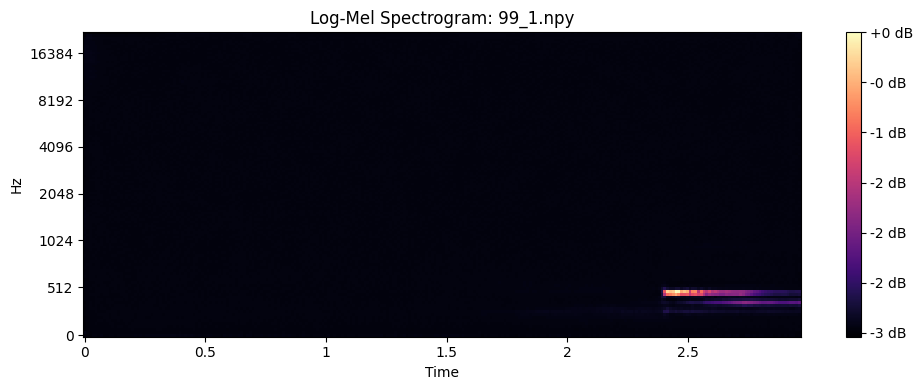

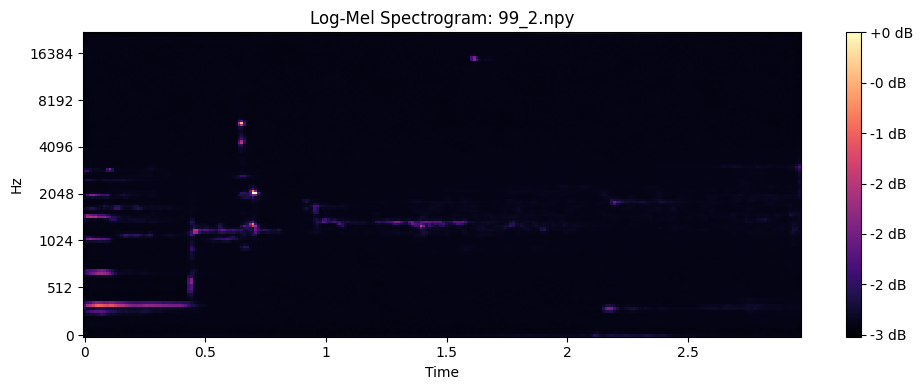

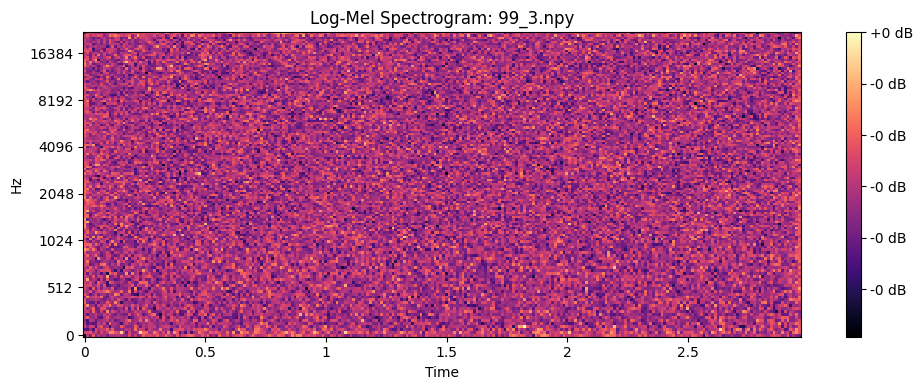

In [23]:
nplist_files = [f for f in os.listdir(sample_dir) if f.endswith(".npy")]

max_files = -1

for i, file in enumerate(nplist_files[:]):
    file_path = os.path.join(sample_dir, file)

    # Load tensors
    mel = np.load(file_path)
    print(file)

    log_S = librosa.power_to_db(mel, ref=np.max)

    # Plot
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(log_S, sr=SAMPLE_RATE, hop_length=512, x_axis='time', y_axis='mel')
    plt.title(f"Log-Mel Spectrogram: {file}")
    plt.colorbar(format="%+2.0f dB")
    plt.tight_layout()
    plt.savefig(os.path.join(EXPORT, f"{file}_Log-Mel.png"))

    # Spectrogram to audio
    y = librosa.feature.inverse.mel_to_audio(mel, sr = SAMPLE_RATE, n_fft=2048, hop_length=512) 
    display(Audio(y, rate=SAMPLE_RATE))
    sf.write(os.path.join(EXPORT, f"{file}.wav"), y, SAMPLE_RATE)
    

## Baseline comparison

In [24]:
baseline = np.random.rand(128,256)
baseline = baseline * SAMPLE_RATE / 2

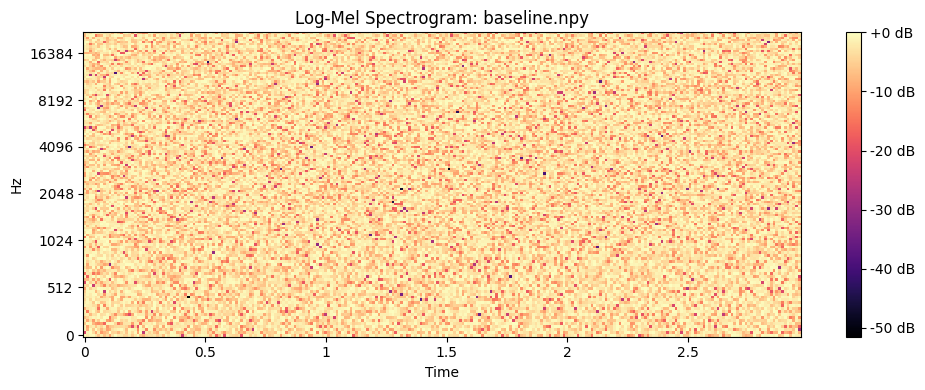

In [25]:
log_S = librosa.power_to_db(baseline, ref=np.max)

file = "baseline.npy"

# Plot
plt.figure(figsize=(10, 4))
librosa.display.specshow(log_S, sr=SAMPLE_RATE, hop_length=512, x_axis='time', y_axis='mel')
plt.title(f"Log-Mel Spectrogram: {file}")
plt.colorbar(format="%+2.0f dB")
plt.tight_layout()
plt.savefig(os.path.join(EXPORT, f"{file}_Log-Mel.png"))

# Spectrogram to audio
y = librosa.feature.inverse.mel_to_audio(mel, sr = SAMPLE_RATE, n_fft=2048, hop_length=512) 
display(Audio(y, rate=SAMPLE_RATE))
sf.write(os.path.join(EXPORT, f"{file}.wav"), y, SAMPLE_RATE)